# Machine Learning - Image Recognition

## Microsoft Azure's Cognitive Science Computer Vision API:

Tags: outdoor, man, standing, sitting, woman, front, table, large, old, mirror, holding, people, wearing, boat, plane, white, bus, horse, motorcycle, riding, train, fire, group


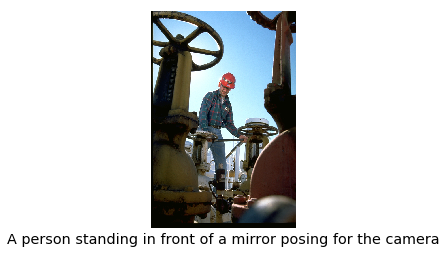

In [1]:
import os
import requests
%matplotlib inline
import matplotlib.pyplot as plt
from PIL import Image
from io import BytesIO

# Replace <Subscription Key> with your valid subscription key.
subscription_key = os.environ['AZURE_KEY']
assert subscription_key

vision_base_url = "https://eastus.api.cognitive.microsoft.com/vision/v2.0/"

analyze_url = vision_base_url + "analyze"

# Set image_path to the local path of an image that you want to analyze.
image_path = r"C:\Users\britt\Documents\Coding\Python\Image Recognition Testing\Images\IMG0038.jpg"

# Read the image into a byte array
image_data = open(image_path, "rb").read()
headers    = {'Ocp-Apim-Subscription-Key': subscription_key,
              'Content-Type': 'application/octet-stream'}
params     = {'visualFeatures': 'Categories,Description,Color'}
response = requests.post(
    analyze_url, headers=headers, params=params, data=image_data)
response.raise_for_status()

# The 'analysis' object contains various fields that describe the image. The most
# relevant caption for the image is obtained from the 'description' property.
analysis = response.json()
image_caption = analysis["description"]["captions"][0]["text"].capitalize()

# Display the image and overlay it with the caption.
image = Image.open(BytesIO(image_data))
plt.imshow(image)
plt.axis("off")
_ = plt.title(image_caption, size="x-large", y=-0.1)

print("Tags: " + ", ".join(analysis["description"]["tags"]))

As much as I wish I loved Azure's image recognition, given it would surely make any integrations easier, this didn't quite hit the mark.

## Clarifai API

In [2]:
from clarifai.rest import ClarifaiApp

app = ClarifaiApp(api_key=os.environ["CLARIFAI_KEY"])

model = app.public_models.general_model
response = model.predict_by_filename(image_path)
for concept in response["outputs"][0]["data"]["concepts"]:
    print("{}  [{:.6f}]".format(concept["name"], concept["value"]))

industry  [0.987615]
people  [0.985546]
man  [0.968303]
adult  [0.959982]
grinder  [0.956256]
petroleum  [0.955489]
pipe  [0.949868]
fuel  [0.948107]
steel  [0.946414]
natural gas  [0.944642]
one  [0.943459]
energy  [0.942980]
gasoline  [0.932056]
pump  [0.930823]
power  [0.925896]
exploration  [0.923320]
iron  [0.918495]
technology  [0.905567]
watercraft  [0.905103]
machine  [0.904843]


Clarifai allows for a company to be able to train custom models, so that concepts unique to the business may be identified. This might help us, but also might be unrealistic. For example, it would be great if we could get the model to correctly tag images as "refinery". However, we would have to feed it a ton of pictures (maybe all), and even then it's such a diverse subject matter that it might not do a great job.

Still, Clarifai proved to be way more accurate than Azure. I'm a lot more impressed with the picture the tags paint, although the words that are used probably aren't going to be what someone would be searching for when they're looking for an image.

## Google Cloud Vision API

This one was a little too involved to want to go through the whole rigamarole, but they had a place on their site where you could drag a picture and see the results.

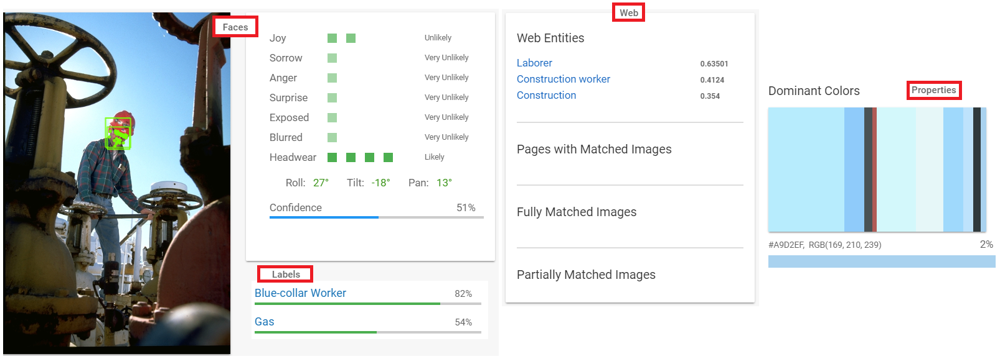

In [3]:
from IPython.display import Image
import json

with open(r"C:\Users\britt\Documents\Coding\Python\Image Recognition Testing\CVTest.json", "r") as file:
    cv_test = json.load(file)

Image(r"C:\Users\britt\Documents\Coding\Python\Image Recognition Testing\Cloud Vision Test.png")

Google's service also has a custom model training aspect, if we did decide to pursue utilizing something like that. Again, though, this might prove to be more work than it's actually worth. Also, this is part of Google Cloud Platform, which has a similar setup to Azure. Might be too much of a hassle to be involved with if we aren't using anything else from Google's suite of cloud services.

## Amazon Rekognition

This one was also a hassle to manually make calls to the API as merely a test, but they also had an area where you could upload the file and see the results.

In [4]:
# import json

# with open(r"C:\Users\britt\Documents\Coding\Python\Image Recognition Testing\rekognitionTest.json", "r") as file:
#     rekognition_test = json.load(file)
# file.close()

# for label in rekognition_test['Labels']:
#     print("{}  [{:6f}]".format(label["Name"], label["Confidence"] / 100))

import boto3

if __name__ == "__main__":

    imageFile=image_path
    client=boto3.client('rekognition', region_name='us-east-2', aws_access_key_id=os.environ['AWS_KEY'], aws_secret_access_key=os.environ['AWS_ACCESS_KEY'])
   
    with open(imageFile, 'rb') as image:
        response = client.detect_labels(Image={'Bytes': image.read()})
         
    for label in response['Labels']:
        print("{}  [{:6f}]".format(label["Name"], label["Confidence"] / 100))

Clothing  [0.991115]
Apparel  [0.991115]
Human  [0.990673]
Person  [0.990673]
Helmet  [0.903392]
Hardhat  [0.865094]
Fire Hydrant  [0.786717]
Hydrant  [0.786717]
Architecture  [0.767444]
Building  [0.767444]
Construction  [0.734978]
Worker  [0.717064]
Pants  [0.663469]
Hat  [0.623764]
Pillar  [0.568524]
Column  [0.568524]
Denim  [0.552832]
Jeans  [0.552832]


This feels like the best so far, as far as labels go. Still not completely on point, but the tags were consistently understandable, at the least. Clarifai had a lot of tags, some were good and some were duds. Google had fewer, but more accurate labels. But Amazon seems to have the best of both worlds, quality AND quantity.

It looks like they also have something, called SageMaker, that can help create custom models. It appears that more coding is required to train the models, there isn't an easy drag-and-drop UI that anyone could use. If less technical users wanted to try to train different concepts, it would be nice for them to have the tools to organize some pictures and just dump them in.

## Further Testing

Because Amazon Rekognition was the most impressive in the context of our sample picture, I'll throw a few more pictures at it to see how it fares.

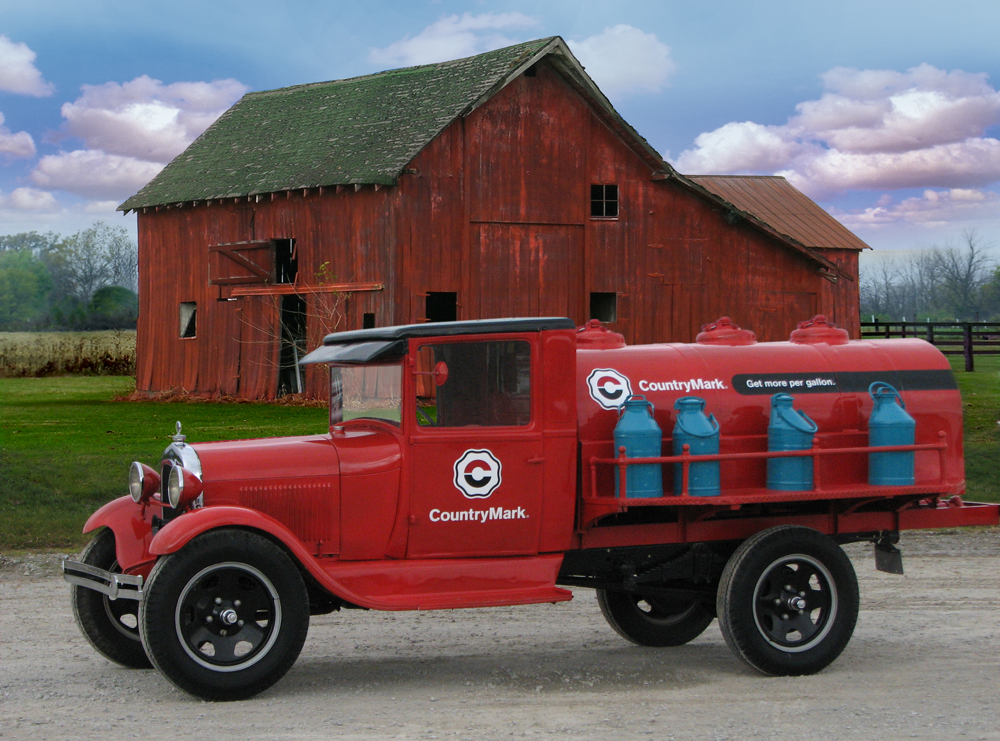

In [8]:
imageFile = r"C:\Users\britt\Documents\Coding\Python\Image Recognition Testing\Images\Vintage Truck w_barn.jpg"
Image(imageFile)

In [9]:
# with open(r"C:\Users\britt\Documents\Coding\Python\Image Recognition Testing\furtherTesting1.json", "r") as file:
#     rekognition_test = json.load(file)
# file.close()

with open(imageFile, 'rb') as image:
    rekognition_test = client.detect_labels(Image={'Bytes': image.read()})

for label in rekognition_test['Labels']:
    print("{}  [{:6f}]".format(label["Name"], label["Confidence"] / 100))

Transportation  [0.973595]
Vehicle  [0.973595]
Truck  [0.973595]
Fire Truck  [0.943624]
Wheel  [0.805645]
Machine  [0.805645]
Outdoors  [0.663142]
Nature  [0.663142]
Countryside  [0.663142]
Rural  [0.600810]
Tire  [0.551918]


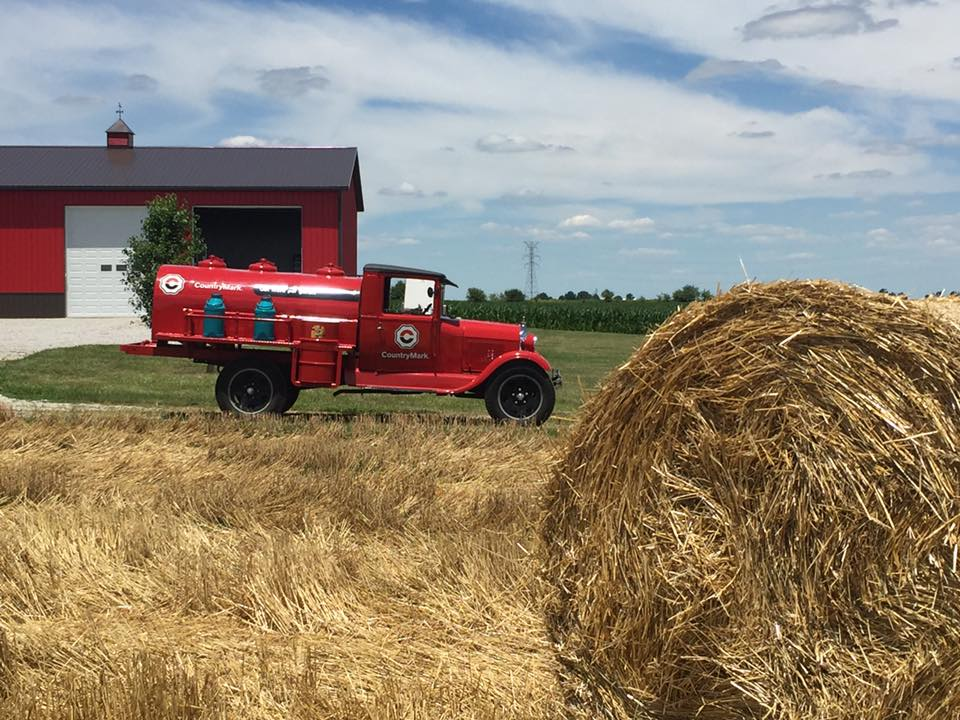

In [16]:
imageFile = r"C:\Users\britt\Documents\Coding\Python\Image Recognition Testing\Images\13512011_1022837647752898_6669435649977753834_n.jpg"
Image(imageFile)

In [15]:
# with open(r"C:\Users\britt\Documents\Coding\Python\Image Recognition Testing\furtherTesting2.json", "r") as file:
#     rekognition_test = json.load(file)
# file.close()

with open(imageFile, 'rb') as image:
    rekognition_test = client.detect_labels(Image={'Bytes': image.read()})

for label in rekognition_test['Labels']:
    print("{}  [{:6f}]".format(label["Name"], label["Confidence"] / 100))

Nature  [0.985965]
Outdoors  [0.982785]
Vehicle  [0.954206]
Truck  [0.954206]
Transportation  [0.954206]
Countryside  [0.950229]
Hay  [0.794405]
Straw  [0.794405]
Rural  [0.577285]
Tire  [0.574178]
Fire Truck  [0.554175]


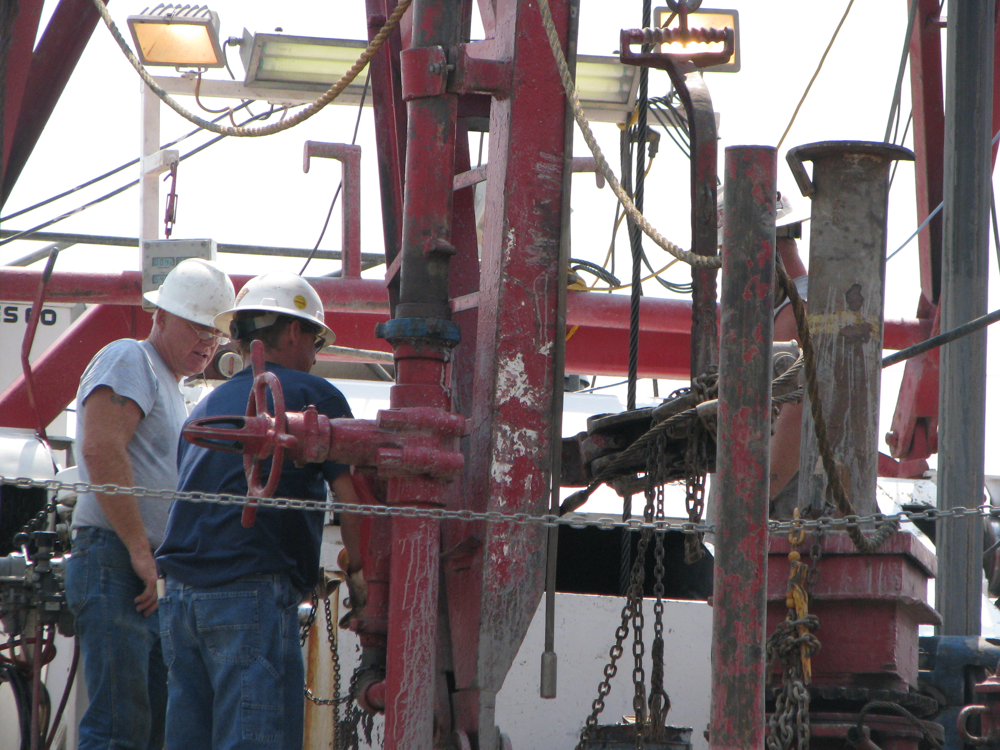

In [17]:
imageFile = r"C:\Users\britt\Documents\Coding\Python\Image Recognition Testing\Images\IMG_1276.JPG"
Image(imageFile)

In [18]:
# with open(r"C:\Users\britt\Documents\Coding\Python\Image Recognition Testing\furtherTesting3.json", "r") as file:
#     rekognition_test = json.load(file)
# file.close()

with open(imageFile, 'rb') as image:
    rekognition_test = client.detect_labels(Image={'Bytes': image.read()})

for label in rekognition_test['Labels']:
    print("{}  [{:6f}]".format(label["Name"], label["Confidence"] / 100))

Human  [0.998962]
Person  [0.998962]
Apparel  [0.988018]
Clothing  [0.988018]
Helmet  [0.988018]
Hardhat  [0.829277]
Utility Pole  [0.712550]
Construction  [0.592878]
Worker  [0.571480]
Pants  [0.568367]


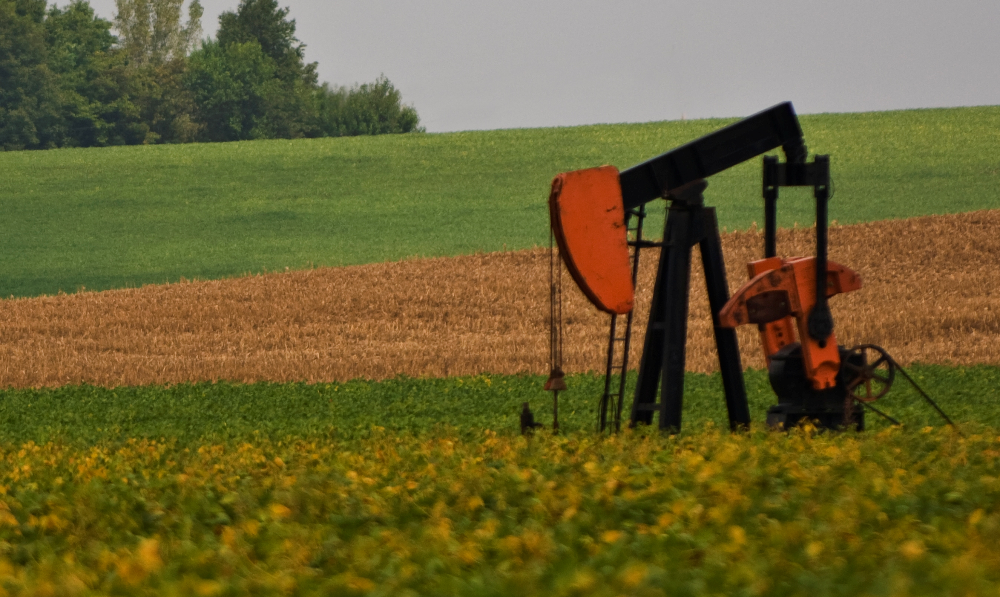

In [19]:
imageFile = r"C:\Users\britt\Documents\Coding\Python\Image Recognition Testing\Images\pump jack horizontal.jpg"
Image(imageFile)

In [22]:
# with open(r"C:\Users\britt\Documents\Coding\Python\Image Recognition Testing\furtherTesting4.json", "r") as file:
#     rekognition_test = json.load(file)
# file.close()

with open(imageFile, 'rb') as image:
    rekognition_test = client.detect_labels(Image={'Bytes': image.read()})

for label in rekognition_test['Labels']:
    print("{}  [{:6f}]".format(label["Name"], label["Confidence"] / 100))

Oilfield  [0.909215]
Outdoors  [0.623959]


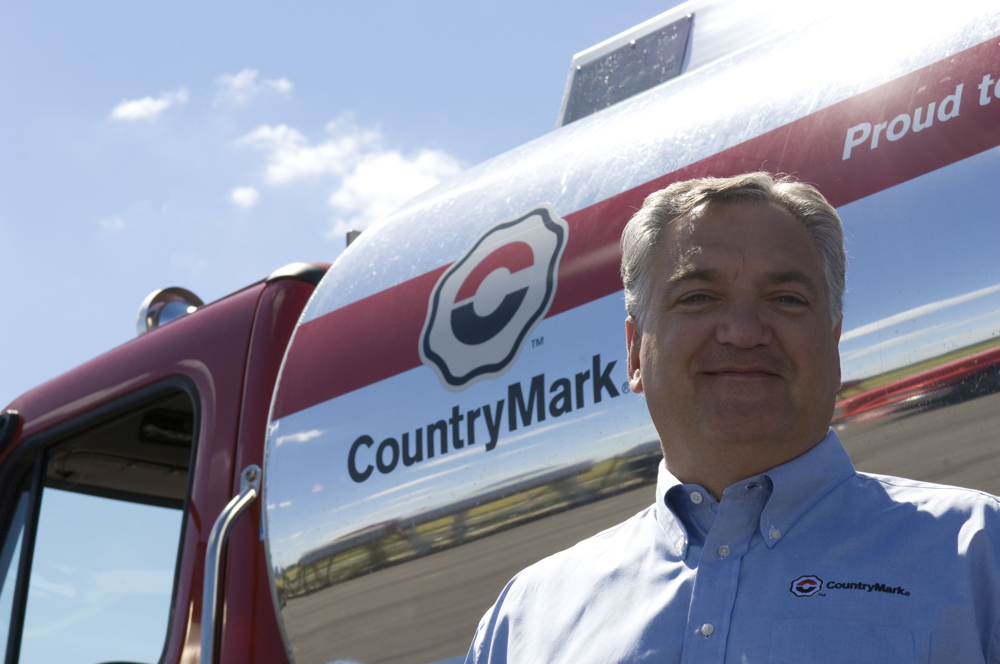

In [23]:
imageFile = r"C:\Users\britt\Documents\Coding\Python\Image Recognition Testing\Images\CMC0907_4885.jpg"
Image(imageFile)

In [25]:
# with open(r"C:\Users\britt\Documents\Coding\Python\Image Recognition Testing\furtherTesting5.json", "r") as file:
#     rekognition_test = json.load(file)
# file.close()

with open(imageFile, 'rb') as image:
    rekognition_test = client.detect_labels(Image={'Bytes': image.read()})

for label in rekognition_test['Labels']:
    print("{}  [{:6f}]".format(label["Name"], label["Confidence"] / 100))

Person  [0.993364]
Human  [0.993364]
Machine  [0.865277]
Tire  [0.824052]
Aircraft  [0.774291]
Vehicle  [0.774291]
Airplane  [0.774291]
Transportation  [0.774291]
Clothing  [0.696937]
Apparel  [0.696937]
Wheel  [0.586505]
Spoke  [0.560979]
Car Wheel  [0.553853]


## Summary

While image recognition is pretty cool in principle, I don't think it would actually benefit us in practice. The resources to get all of the images tagged wouldn't be worth it, for the labels that would be generated.

While AWS's Rekognition was the clear winner in generating consistently accurate tags, the labels generated still weren't always what people would probably be searching for while seeking a picture. While we could train custom models to recognize an image taken at a refinery (which would be the most useful custom model, other than our logo), I'm still pessimistic as to how reliable that would be due to the varying nature of the subject content.